# EDA аэропорты 

In [1]:
#Импортируем необходимые библиотеки для работы
!pip install pycountry pycountry-convert
!pip install folium
import pandas as pd
import numpy as np 
import pycountry
import pycountry_convert as pc
import folium

# Задание 1 
**условие:**
Найти 10 самых крупных аэропортов в Мире по сумме взлет/посадок. Результат в виде DataFrame, индекс 0 уровня Страна, индекс 1 уровня Название аэропорта, колонки взлеты, посадки, суммы взлет/посадок. Важно упорядочить данные от наибольшего к наименьшему.

Источники данных:
Аэропорты («Airport database») – названия колонок начинаются с Airport ID до Source:
https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat
Маршрутная сеть («Route database») – названия колонок начинаются с Airline до Equipment:
https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat
Основной источник: https://openflights.org/data


# Cчитываем данные 

In [16]:
airport_data = pd.read_csv('https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat',
                           header = None,
                           names = ['Airport_ID',
                                    'Name',
                                    'City',
                                    'Country',
                                    'IATA',
                                    'ICAO', 
                                    'Latitude',
                                    'Longitude',
                                    'Altitude',
                                    'Timezone',
                                    'DST', 
                                    'Tz database time zone',
                                    'Type',
                                    'Source'])

In [17]:
airport_data.head(2)

,Airport_ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz database time zone,Type,Source
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.08169,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.20708,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports


In [18]:
rout_data = pd.read_csv('https://raw.githubusercontent.com/jpatokal/openflights/master/data/routes.dat',
                           header = None,
                           names = ['Airline',
                                    'Airline ID',
                                    'Source Airport',
                                    'Source Airport ID',
                                    'Destination Airport',
                                    'Destination Airport ID',
                                    'Codeshare',
                                    'Stops',
                                    'Equipment'])

In [19]:
rout_data.head(5)

,Airline,Airline ID,Source Airport,Source Airport ID,Destination Airport,Destination Airport ID,Codeshare,Stops,Equipment
0,2B,410,AER,2965,KZN,2990,NaN,0,CR2
1,2B,410,ASF,2966,KZN,2990,NaN,0,CR2
2,2B,410,ASF,2966,MRV,2962,NaN,0,CR2
3,2B,410,CEK,2968,KZN,2990,NaN,0,CR2
4,2B,410,CEK,2968,OVB,4078,NaN,0,CR2


## можно будет работать либо с ID аэропортов, либо брать IATA  я решила посмотреть оба случая, чтобы потом решить где получится больше данных 

### на этапе мерджа возникла проблема с типами в ID

In [6]:
airport_data['Airport_ID'] = airport_data['Airport_ID'].astype(str)


In [7]:
rout_data['Destination Airport ID'] = rout_data['Destination Airport ID'].astype(str)
rout_data['Source Airport ID'] = rout_data['Source Airport ID'].astype(str)

In [11]:
total_arrive =(pd.DataFrame(rout_data['Destination Airport ID'].value_counts())
               .reset_index()
               .rename(columns = {'Destination Airport ID' : 'Airport_ID', 'count' : 'total_arive'}))
total_arrive.head()

,Airport_ID,total_arive
0,3682,911
1,3830,550
2,3364,534
3,507,524
4,1382,517


In [12]:
total_take_off = (pd.DataFrame(rout_data['Source Airport ID'].value_counts())
               .reset_index()
               .rename(columns = {'Source Airport ID' : 'Airport_ID', 'count' :'total_take_off' }))
total_take_off.head()

,Airport_ID,total_take_off
0,3682,915
1,3830,558
2,3364,535
3,507,527
4,1382,524


In [13]:
total_flights = total_arrive.merge(total_take_off,
                                   on = 'Airport_ID',
                                   how = 'inner').fillna(0)

In [14]:
total_flights['flights'] = total_flights['total_take_off'] + total_flights['total_arive']
total_flights.head(2)

,Airport_ID,total_arive,total_take_off,flights
0,3682,911,915,1826
1,3830,550,558,1108


In [15]:
airport_routs_total= total_flights.merge(airport_data[['Airport_ID', 'Name', 'Country']], on='Airport_ID', how = 'inner')
(airport_routs_total
 .set_index(['Country','Name'])
 .sort_values( by = 'flights',ascending = False)
 .head(10))
 

Airport_ID  \
Country        Name                                                          
United States  Hartsfield Jackson Atlanta International Airport       3682   
               Chicago O'Hare International Airport                   3830   
China          Beijing Capital International Airport                  3364   
United Kingdom London Heathrow Airport                                 507   
France         Charles de Gaulle International Airport                1382   
United States  Los Angeles International Airport                      3484   
Germany        Frankfurt am Main Airport                               340   
United States  Dallas Fort Worth International Airport                3670   
               John F Kennedy International Airport                   3797   
Netherlands    Amsterdam Airport Schiphol                              580   

                                                                 total_arive  \
Country        Name                                                            
United States  Hartsfield Jackson Atlanta International Airport          911   
               Chicago O'Hare International Airport                      550   
China          Beijing Capital International Airport                     534   
United Kingdom London Heathrow Airport                                   524   
France         Charles de Gaulle International Airport                   517   
United States  Los Angeles International Airport                         498   
Germany        Frankfurt am Main Airport                                 493   
United States  Dallas Fort Worth International Airport                   467   
               John F Kennedy International Airport                      455   
Netherlands    Amsterdam Airport Schiphol                                450   

                                                                 total_take_off  \
Country        Name                                                               
United States  Hartsfield Jackson Atlanta International Airport             915   
               Chicago O'Hare International Airport                         558   
China          Beijing Capital International Airport                        535   
United Kingdom London Heathrow Airport                                      527   
France         Charles de Gaulle International Airport                      524   
United States  Los Angeles International Airport                            492   
Germany        Frankfurt am Main Airport                                    497   
United States  Dallas Fort Worth International Airport                      469   
               John F Kennedy International Airport                         456   
Netherlands    Amsterdam Airport Schiphol                                   453   

                                                                 flights  
Country        Name                                                       
United States  Hartsfield Jackson Atlanta International Airport     1826  
               Chicago O'Hare International Airport                 1108  
China          Beijing Capital International Airport                1069  
United Kingdom London Heathrow Airport                              1051  
France         Charles de Gaulle International Airport              1041  
United States  Los Angeles International Airport                     990  
Germany        Frankfurt am Main Airport                             990  
United States  Dallas Fort Worth International Airport               936  
               John F Kennedy International Airport                  911  
Netherlands    Amsterdam Airport Schiphol                            903

теперь сделаю то же для IATA, чтобы сравнить результат
тут пришла к выводу, что неполнота данных в IATA и пропуски в ID не повлияли на ответ задачи

# Задание 2 
Найти проблемные данные, ошибочные данные, несоответствия в данных и т.п.
Результаты сгруппировать по типам выявленных ошибок. 
Используйте markdown для поясняющего текста.

In [22]:
airport_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7698 entries, 0 to 7697
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Airport_ID             7698 non-null   object 
 1   Name                   7698 non-null   object 
 2   City                   7649 non-null   object 
 3   Country                7698 non-null   object 
 4   IATA                   7698 non-null   object 
 5   ICAO                   7698 non-null   object 
 6   Latitude               7698 non-null   float64
 7   Longitude              7698 non-null   float64
 8   Altitude               7698 non-null   int64  
 9   Timezone               7698 non-null   object 
 10  DST                    7698 non-null   object 
 11  Tz database time zone  7698 non-null   object 
 12  Type                   7698 non-null   object 
 13  Source                 7698 non-null   object 
dtypes: float64(2), int64(1), object(11)
memory usage: 842.1+

In [23]:
for i in airport_data.columns:
    print(airport_data[i].describe())

count     7698
unique    7698
top          1
freq         1
Name: Airport_ID, dtype: object
count                  7698
unique                 7658
top       San Pedro Airport
freq                      3
Name: Name, dtype: object
count       7649
unique      6955
top       London
freq           9
Name: City, dtype: object
count              7698
unique              237
top       United States
freq               1512
Name: Country, dtype: object
count     7698
unique    6073
top         \N
freq      1626
Name: IATA, dtype: object
count     7698
unique    7698
top       AYGA
freq         1
Name: ICAO, dtype: object
count    7698.000000
mean       25.808442
std        28.404946
min       -90.000000
25%         6.907983
50%        34.085701
75%        47.239551
max        89.500000
Name: Latitude, dtype: float64
count    7698.000000
mean       -1.390546
std        86.519162
min      -179.876999
25%       -78.974699
50%         6.375653
75%        56.000599
max       179.951004
Name: Longit

Name: Country, dtype: object
count     7698
unique    6073
top         \N
freq      1626
в странах много пропусков 

в столбце "DST" также много пропусков 

#### рассмотрим первую и самую очевидную группу ошибок : пропуски даннных (/N,//N)
"Данные закодированы в UTF-8. Специальное значение \N используется для "NULL", чтобы указать, что значение недоступно, и автоматически распознается MySQL при импорте." (это из сайта)


тут есть объяснение возникновения такой ошибки:
"Примечания : Авиакомпании с нулевыми кодами/позывными/странами обычно представляют авиакомпании, добавленные пользователем. Поскольку данные предназначены в первую очередь для текущих рейсов, несуществующие коды IATA обычно не включаются. Например, "Sabena" не указана с кодом SN IATA, поскольку "SN" в настоящее время используется ее преемницей Brussels Airlines."

чтобы выявить ощибку получше изменю /N на np.nan и посчитаю их колличество 

In [24]:
airport_data['IATA'] = airport_data['IATA'].replace('\\N', np.nan)
empty = airport_data['IATA'].isna().sum()
print(f'колличество пропусков: {empty}')

колличество пропусков: 1626


также заметила \N, с которым возникает сложность, т к программа считывает как перенос строки 

In [25]:
rout_data.columns[(rout_data == r'\N').any()]

Index(['Airline ID', 'Source Airport ID', 'Destination Airport ID'], dtype='object')

In [26]:
airport_data.columns[(airport_data == r'\N').any()]

Index(['ICAO', 'Timezone', 'DST', 'Tz database time zone'], dtype='object')

## Вторая группа ошибок: некорректные данные
(часть ошибок дописала после того, как отрисовала графики и увидела странные расположения некоторых аэропортов)

1 первое что можно заметить при выполнении первого задания это повторяющиеся аэропорты, а следовательно разные ID, что странно


In [27]:
airport_data.groupby('Name')['Airport_ID'].filter(lambda x: len(x) > 1) # тут для примера вывела дублирующиеся аэропорты по названию,
# но возможно могут быть дублирующиеся и по ID

44         45
180       182
203       205
255       258
516       521
        ...  
7053    11816
7084    11847
7173    11936
7438    13341
7647    13735
Name: Airport_ID, Length: 76, dtype: object

2 тут вообще странности, что самолеты прилетают из аэропортов, которых нет в базе общей(аналагично для вылетов, вылетают из аэропорта, которого нет в общей базе?....)

In [28]:
rout_data[~rout_data['Source Airport ID'].isin(airport_data['Airport_ID'])]['Source Airport ID'].unique() 

array(['\\N', '7167', '7168', '7164', '7173', '7144', '7145', '7147',
       '5475', '8858', '7215', '7119', '7110', '7112', '9741', '7113',
       '4385', '8202', '9742', '7212', '7216', '7218', '8201', '7099',
       '8203', '8492', '7238', '7219', '6721', '7239', '7241', '7200',
       '7193', '8204', '5955', '8206', '8207', '5957', '7901', '7895',
       '5958', '7163', '7165', '9747', '5804', '7118', '5454', '7029',
       '7287', '7288', '5455', '6463', '7356', '7358', '5477', '9823',
       '5712', '7310', '6428', '5979', '5980', '5984', '6476', '7528',
       '9841', '6750', '5601', '9827', '6132', '4248', '9745', '7155',
       '7153', '7102', '6449', '6448', '7478', '7479', '6919', '7138',
       '7137', '2611', '6231', '9181', '8735', '7237', '7150', '7151',
       '7152', '5805', '9540', '8174', '6457', '8170', '8173', '5855',
       '6770', '9757', '9756', '10119', '8962', '9842', '7562', '9135',
       '4389', '7141', '7243', '4264', '6129', '6135'], dtype=object)

In [29]:
rout_data[~rout_data['Destination Airport ID'].isin(airport_data['Airport_ID'])]['Destination Airport ID'].unique() 

array(['\\N', '7167', '7168', '7164', '7163', '7176', '7173', '7165',
       '7172', '7145', '7144', '7147', '8858', '5475', '7215', '7119',
       '7112', '9741', '7113', '7110', '7218', '4385', '8202', '7099',
       '7212', '9742', '7216', '8201', '8203', '8492', '7219', '7200',
       '7238', '7239', '7193', '6721', '7241', '8207', '5955', '5957',
       '7901', '7895', '5958', '9758', '8204', '8206', '9747', '5804',
       '7118', '5454', '6463', '7287', '7288', '5455', '7029', '7356',
       '5477', '7358', '9823', '5712', '7310', '6428', '5980', '5984',
       '5979', '6476', '7528', '9841', '6750', '9827', '5601', '6132',
       '4248', '9745', '7102', '7155', '7153', '6448', '6449', '7478',
       '7479', '6919', '7137', '7138', '6231', '9181', '8735', '7152',
       '7151', '7237', '7150', '5805', '8170', '8173', '6457', '8174',
       '9540', '6770', '5855', '9757', '9756', '2611', '10119', '8962',
       '9842', '7562', '9135', '4389', '7141', '7243', '4264', '6129',
      

тут можно заметить, что это +- одни и те же аэропорты, которых нет в 'Airport_ID'

3 опять приколы с аэропортом вылета и прилёта, иногда самолёт может вылететь и вернуться в этот же аэропорт 


In [30]:
same = rout_data[rout_data['Source Airport'] == rout_data['Destination Airport']]
same

,Airline,Airline ID,Source Airport,Source Airport ID,Destination Airport,Destination Airport ID,Codeshare,Stops,Equipment
33276,IL,10121,PKN,3910,PKN,3910,NaN,0,AT7


In [31]:
same_1 = rout_data[rout_data['Source Airport ID'] == rout_data['Destination Airport ID']]
same_1

,Airline,Airline ID,Source Airport,Source Airport ID,Destination Airport,Destination Airport ID,Codeshare,Stops,Equipment
29996,GL,921,IKE,\N,SAE,\N,NaN,0,BH2
29999,GL,921,IOT,\N,JUU,\N,NaN,0,BH2
30002,GL,921,IUI,\N,TQA,\N,NaN,0,BH2
30035,GL,921,JUU,\N,IOT,\N,NaN,0,BH2
30048,GL,921,KGQ,\N,UPK,\N,NaN,0,BH2
30050,GL,921,KHQ,\N,NSQ,\N,NaN,0,BH2
30063,GL,921,NSQ,\N,KHQ,\N,NaN,0,BH2
30065,GL,921,QFG,\N,QOQ,\N,NaN,0,BH2
30069,GL,921,QUV,\N,QFN,\N,NaN,0,BH2
30072,GL,921,SAE,\N,IKE,\N,NaN,0,BH2


2  при работе с Airoport_ID заметила, что некоторые ID не существуют вовсе 
 

In [32]:
len(airport_data.Airport_ID.unique()[100:200]) #тут к примеру видно, что пропущен ID, ошибка неочевидная, возможно такого id нет вовсе

100

Третий класс ошибок: географическая ошибка 

1 в широте/долготе/высоте над уровнем моря 
тут я укажу просто с высотой над уровнем моря, т. к. не та локация будет видна при визуализации 

In [33]:
airport_data['Altitude'].describe()

count     7698.000000
mean      1015.873344
std       1628.775132
min      -1266.000000
25%         63.000000
50%        352.000000
75%       1203.000000
max      14472.000000
Name: Altitude, dtype: float64

на сайте указанно, что высота тут измеряется в футах, гуглим где находится самый высоки и самый низкий аэропорт, т к результаты подозрительные
"4.250 метров над уровнем моря в Тибете" (какой-то там сайт) в футах это дипсик сказал 13,943 фута, значит тут ошибка 

In [34]:
airport_data[airport_data['Altitude'] == 14472] # географическое открытие 

,Airport_ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz database time zone,Type,Source
6542,9310,Daocheng Yading Airport,Daocheng,China,DCY,ZUDC,29.323056,100.053333,14472,8,N,Asia/Shanghai,airport,OurAirports


есть ещё 'ошибки' или неточности (все же ПРЕЗИДЕНТСКАЯ АКАДЕМИЯ) со странами 
например почему-то несуществующие страны появились 


In [35]:
airport_data['Country'].unique() 

array(['Papua New Guinea', 'Greenland', 'Iceland', 'Canada', 'Algeria',
       'Benin', 'Burkina Faso', 'Ghana', "Cote d'Ivoire", 'Nigeria',
       'Niger', 'Tunisia', 'Togo', 'Belgium', 'Germany', 'Estonia',
       'Finland', 'United Kingdom', 'Guernsey', 'Jersey', 'Isle of Man',
       'Falkland Islands', 'Netherlands', 'Ireland', 'Denmark',
       'Faroe Islands', 'Luxembourg', 'Norway', 'Poland', 'Sweden',
       'South Africa', 'Botswana', 'Congo (Brazzaville)',
       'Congo (Kinshasa)', 'Swaziland', 'Central African Republic',
       'Equatorial Guinea', 'Saint Helena', 'Mauritius',
       'British Indian Ocean Territory', 'Cameroon', 'Zambia', 'Comoros',
       'Mayotte', 'Reunion', 'Madagascar', 'Angola', 'Gabon',
       'Sao Tome and Principe', 'Mozambique', 'Seychelles', 'Chad',
       'Zimbabwe', 'Malawi', 'Lesotho', 'Mali', 'Gambia', 'Spain',
       'Sierra Leone', 'Guinea-Bissau', 'Liberia', 'Morocco', 'Senegal',
       'Mauritania', 'Guinea', 'Cape Verde', 'Ethiopia', 'B

In [36]:
airport_data[airport_data['Country']== "Ukraine"].head(5)

,Airport_ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz database time zone,Type,Source
2787,2939,Boryspil International Airport,Kiev,Ukraine,KBP,UKBB,50.345001,30.894699,427,2,E,Europe/Kiev,airport,OurAirports
2788,2940,Donetsk International Airport,Donetsk,Ukraine,DOK,UKCC,48.073601,37.739700,791,2,E,Europe/Kiev,airport,OurAirports
2789,2941,Dnipropetrovsk International Airport,Dnepropetrovsk,Ukraine,DNK,UKDD,48.357201,35.100601,481,2,E,Europe/Kiev,airport,OurAirports
2790,2942,Simferopol International Airport,Simferopol,Ukraine,SIP,UKFF,45.052200,33.975101,639,3,E,Europe/Simferopol,airport,OurAirports
2791,2944,Kiev Zhuliany International Airport,Kiev,Ukraine,IEV,UKKK,50.401940,30.451940,587,2,E,Europe/Kiev,airport,OurAirports


вообще ошибок именно с локацией тут много, иногда просто штат США называет себя Арабскими Эмиратами, или вот забавный пример 

In [37]:
airport_data[airport_data.IATA == 'OEL'] 

,Airport_ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz database time zone,Type,Source
6862,11100,Oryol Yuzhny Airport,Oakley,United States,OEL,UUOR,52.9347,36.002201,656,-5,A,\N,airport,OurAirports


In [43]:
airport_data[(airport_data['ICAO'].str.len() < 4)]['ICAO'] # на сайте сказанно, что ICAO состоит из 4 знаков 

4435    Q51
4501    03N
4765    5A8
4769    KQA
4770    S31
5860     \N
Name: ICAO, dtype: object

In [44]:
airport_data[(airport_data['ICAO'] == airport_data['IATA'])]

,Airport_ID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,Tz database time zone,Type,Source
4769,6134,Akutan Seaplane Base,Akutan,United States,KQA,KQA,54.13377,-165.778896,0,-9,A,America/Anchorage,airport,OurAirports


(Аэропорт «Акутан» страны «Соединенные Штаты» является ближайшим аэропортом к городу «»
. Авиационное название аэропорта по IATA – KQA, а по ICAO KQA.) ну это как видно, если погуглить не особо ошибка 


В таблицу 1 добавить колонку с названием континента (континенты: Европа, Азия, Африка, Сев. Америка, Юж. Америка, Австралия или Океания, Антарктида).

https://pypi.org/project/pycountry-convert/

исправила само определение азии\европы, т к после визуализации была ошибка с определением 
азии и европы на некоторых странах

In [46]:
def continent(airport_data):
    country = airport_data['Country']
    lon = airport_data['Longitude']
    lat = airport_data['Latitude']
    # я попросила написать это дипсик, сама в географии плохо бы разобралась (сравнила с картинкой ) 
    if country == 'Russia':
        return 'Asia' if lon > 60.0 else 'Europe'
    elif country == 'Turkey':
        return 'Asia' if lon > 29.0 else 'Europe'
    elif country == 'Egypt':
        return 'Asia' if (lon > 32.0 and lat > 28.0) else 'Africa'
    elif country == 'Kazakhstan':
        return 'Europe' if lon < 50.0 else 'Asia'
    elif country == 'Spain':
        return 'Africa' if (27.5 <= lat <= 29.5) and (-18.0 <= lon <= -13.0) else 'Europe'
    else:

        try:
            country_code = pc.country_name_to_country_alpha2(country) 
            continent_code = pc.country_alpha2_to_continent_code(country_code) 
            continent_name = pc.convert_continent_code_to_continent_name(continent_code) 
            return continent_name
       
        except Exception:
            return np.nan


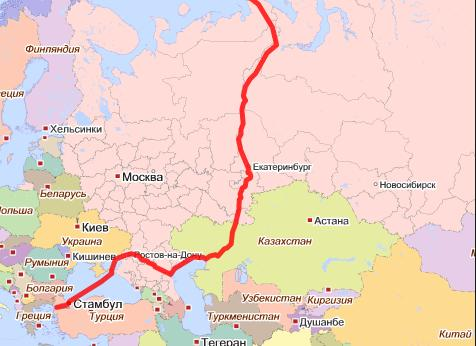

In [47]:
airport_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7698 entries, 0 to 7697
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Airport_ID             7698 non-null   object 
 1   Name                   7698 non-null   object 
 2   City                   7649 non-null   object 
 3   Country                7698 non-null   object 
 4   IATA                   6072 non-null   object 
 5   ICAO                   7698 non-null   object 
 6   Latitude               7698 non-null   float64
 7   Longitude              7698 non-null   float64
 8   Altitude               7698 non-null   int64  
 9   Timezone               7698 non-null   object 
 10  DST                    7698 non-null   object 
 11  Tz database time zone  7698 non-null   object 
 12  Type                   7698 non-null   object 
 13  Source                 7698 non-null   object 
dtypes: float64(2), int64(1), object(11)
memory usage: 842.1+

In [48]:
airport_data['Continent'] = airport_data.apply(continent,axis = 1 )

In [49]:
airport_data['Continent'].describe()

count              7569
unique                6
top       North America
freq               2312
Name: Continent, dtype: object

In [50]:
airport_data['Continent'].unique()

array(['Oceania', 'North America', 'Europe', 'Africa', nan,
       'South America', 'Asia'], dtype=object)

проблемы с бывшими колониями, ошибками в данных

In [51]:
airport_data.iloc[5621, 3] = 'Russia'
airport_data.iloc[5462, 3] = 'Hungary'
airport_data.iloc[5001, 3] = 'United States'
airport_data.iloc[5013, 3] = 'United States'
airport_data.iloc[5920, 3] = 'Saint Helena'
airport_data.iloc[4523, 3] = 'United States'
airport_data.iloc[5621, -1] = 'Europe'
airport_data.iloc[5462, -1] = 'Europe'
airport_data.iloc[5001, -1] = 'North America'
airport_data.iloc[5013, -1] = 'North America'
airport_data.iloc[5920, -1] = 'Africa'
airport_data.iloc[4523, -1] = 'North America'

На карте мира, для каждого континента по отдельности, нанести все аэропорты континента (помним про код IATA) – это 7 различных карт. 
Можно через меню выбора континента, используя Bokeh или Plotly.

In [54]:
def plot_airports_on_map_all(airport_data):
    # Создаём карту
    m = folium.Map(location=[30, 0], zoom_start=2)
    # Цвета для континентов
    colors = {
        'Europe': 'pink',
        'Asia': 'red',
        'Africa': 'green',
        'North America': 'purple',
        'South America': 'orange',
        'Oceania': 'darkred',
        'Antarctica': 'gray'}
    
    # Группы для каждого континента (слой на карте)
    continents_groups_for_legend = {
        continent: folium.FeatureGroup(name=continent, show=False)
        for continent in colors.keys()
    }
    
    # Наносим аэропорты на карту
    for i, row in airport_data.iterrows():
        continent = row['Continent']  # Берём конкретное значение из строки
        if continent in continents_groups_for_legend:
            folium.CircleMarker(
                location=[row['Latitude'], row['Longitude']], 
                radius=5,
                fill=True,
                popup=row['Name'],
                color=colors[continent],
                fill_color=colors[continent],
                fill_opacity=0.7
            ).add_to(continents_groups_for_legend[continent])  # Добавляем в нужную группу
    
    
    for group in continents_groups_for_legend.values():# тут циклом добавляется на карту 
        group.add_to(m)
    
    
    folium.LayerControl().add_to(m)# как я поняла тут слои 
    
    return m

In [55]:
plot_airports_on_map_all(airport_data)

несмоттря на то что в задании 3 я правила вручную сильно очевидные ошибки из-за плохих даннных не очень хорошо отрисовалось
я пыталась изначально найти закономерность почему некоторые аэропорты неверно определены, потом на сайте нашла, что там проблема, что не все рейсы вводят люди, работающие в этой сфере и поэтому ошибки
